- SkillFactory Data science pro
- 10 2022 
- Skripnichenko Elena

Проект - лабораторная работа по применению на практике методов и инструментов работы с временными рядами. 

Для работы использованы данные по прогнозированию объёмов продаж тысяч товаров, реализованных в различных магазинах Favorita, расположенных в Эквадоре. Данные включают в себя даты, информацию о:
 - магазине и товаре, 
 - факте продаж товаров, 
 - объёме продаж. 

# Decomposition
Характеристики и параметры временных  рядов.

## Imports 

In [1]:
#data
import pandas as pd 
import numpy as  np 

#stat
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose 
from sklearn.model_selection import TimeSeriesSplit

# visuals 
import matplotlib.pyplot as plt

In [2]:
RANDOM_STATE = 42

## Data 

Task 1.

Загрузите датасет train.csv. Датасет состоит из данных для разных магазинов (store_nbr). Для каждого магазина для дат указан продукт и его количество ('unit_sales'). 



Файл довольно большой, так что чтение будет chunk-ами в mylist, который после конкатенации удалим.

In [3]:
mylist = [] 
for chunk in pd.read_csv('train.csv', sep = ',', chunksize=20000, low_memory=False): 
    mylist.append(chunk)
    
df = pd.concat(mylist, axis=0)

In [4]:
df.columns

Index(['id', 'date', 'store_nbr', 'item_nbr', 'unit_sales', 'onpromotion'], dtype='object')

Cross check

In [5]:
df.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [6]:
# удалим временную переменную 
del mylist

##  Grouping

Task 2. 
Задание будем выполнять для магазина с номером 25. 
Для этого группируем данные по дате и суммируйте количество всех продаж.


In [7]:
data = df[df.store_nbr == 25].groupby('date')['unit_sales'].sum().reset_index()

In [8]:
data.head() 

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


## Seasonal decomposition 

Task 3. Сделайте сезонную декомпозицию.

Используем функцию seasonal decompose, она разложит временной ряд на трендовую,  сезонную и шумовую составляющие. 

### Index prep

In [9]:
data.index

RangeIndex(start=0, stop=1618, step=1)

In [10]:
# приведем индексы к стандарту даты 
data = data.set_index(pd.DatetimeIndex(data['date']))
data

,date,unit_sales
date,,
2013-01-01,2013-01-01,2511.619
2013-01-02,2013-01-02,5316.224
2013-01-03,2013-01-03,4442.913
2013-01-04,2013-01-04,4844.354
2013-01-05,2013-01-05,5817.526
...,...,...
2017-08-11,2017-08-11,22800.841
2017-08-12,2017-08-12,15090.753
2017-08-13,2017-08-13,8570.598


In [11]:
data.date.isnull().sum()

0

In [12]:
# удаляем date стлб
data.drop(['date'], axis = 1, inplace=True)
data.head()

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


In [13]:
data.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2017-08-06', '2017-08-07', '2017-08-08', '2017-08-09',
               '2017-08-10', '2017-08-11', '2017-08-12', '2017-08-13',
               '2017-08-14', '2017-08-15'],
              dtype='datetime64[ns]', name='date', length=1618, freq=None)

### Decomposition 

In [14]:
#decomposition = seasonal_decompose(df.asfreq('MS').fillna(df['unit_sales'].mean()), model='additive')
decomposition = seasonal_decompose(data.asfreq('D').fillna(data['unit_sales'].mean()), model='additive')

<Figure size 4000x1000 with 0 Axes>

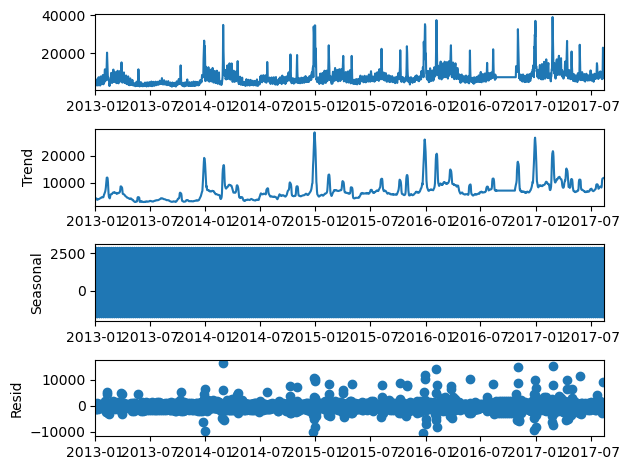

In [15]:
plt.figure(figsize=(40,10))

decomposition.plot()
plt.show()

In [16]:
trend = decomposition.trend
seasonal = decomposition.seasonal
residue = decomposition.resid

In [17]:
residue.head()

date
2013-01-01            NaN
2013-01-02            NaN
2013-01-03            NaN
2013-01-04   -1204.142439
2013-01-05   -1221.640418
Freq: D, Name: resid, dtype: float64

In [18]:
residue.tail()

date
2017-08-11    9280.479132
2017-08-12     561.850582
2017-08-13            NaN
2017-08-14            NaN
2017-08-15            NaN
Freq: D, Name: resid, dtype: float64

In [19]:
residue = residue.dropna()
residue.head()

date
2013-01-04   -1204.142439
2013-01-05   -1221.640418
2013-01-06    -147.664195
2013-01-07     174.592178
2013-01-08     986.149458
Freq: D, Name: resid, dtype: float64

### responses 

Task 4. В Jupyter Notebook ответьте на вопросы:

    1. Сколько элементов содержит исходный датасет?
    2. Сколько элементов содержит шумовая часть?
    3. Сколько числовых элементов содержит шумовая часть?
    4. Сколько элементов содержит сезонная часть?
    5. Сколько числовых элементов содержит трендовая часть?

Временные ряды состоят из двух типов элементов: 
* периода времени, за который или по состоянию на который приводятся числовые значения; 
* числовых значений того или иного показателя, называемых уровнями ряда.

#### 1. Сколько элементов содержит исходный датасет?

In [20]:
# Числовые элементы + index
len(data)*2

3236

3236 элементов содержит исходный датасет (сгруппированные по дате суммарные продажи  для магазина с номером 25, data).

#### 2. Сколько элементов содержит шумовая часть?

In [21]:
# Числовые элементы + index
len(residue) * 2

3364

3364 элемента содержит шумовая часть residue.

#### 3. Сколько числовых элементов содержит шумовая часть?

1682 числовых элемента содержит шумовая часть residue.

#### 4. Сколько элементов содержит сезонная часть?

3376 элементов содержит сезонная часть seasonal.

In [22]:
len(seasonal)

1688

#### 5. Сколько числовых элементов содержит трендовая часть?

In [23]:
len(trend)

1688

1688 числовых элементов содержит трендовая часть trend.

## Dickey — Fuller test
Task 5. Выполните тест Дики-Фуллера. 

In [24]:
test = adfuller(data['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('Ряд не стационарен.')
else:
    print ('Ряд стационарен.')

adf:  -4.858992665318179
p-value:  4.188394192907804e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
Ряд стационарен.


## Split 


### Splitter

Task 1. 
Разбейте временной ряд, полученный в предыдущем юните, на три (train + test) набора. Для этого воспользуйтесь TimeSeriesSplit из sklearn.model_selection с параметром n_splits=3 и test_size=7. Наборы данных можно получить, вызвав метод split (временной ряд) у инициализированного TimeSeriesSplit.

In [25]:
tscv = TimeSeriesSplit(n_splits=3, test_size=7)

In [26]:
tscv

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=7)

In [27]:
tscv.split(data)

<generator object TimeSeriesSplit.split at 0x00000216C93C5350>

### Split sizes
Task 2. Выведите размеры полученных подвыборок.


In [28]:
train_test_groups = tscv.split(data) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


# Factors

## Time row

Task 1 Выберите временной ряд для одного магазина (можно использовать из прошлого задания).

Продолжу работу над данными суммарных продаж для 25-ого магазина.

## Rolling mean
Task 2 Постройте скользящее среднее c окном 5.

In [29]:
data['rolling_mean'] = data.unit_sales.rolling(window=5).mean()

## Rolling Std
Task 3 Постройте скользящее квадратическое отклонение c окном 5. 

In [30]:
data['rolling_std'] = data.unit_sales.rolling(window=5).std()

## Bollinger bands
Task 4 Постройте так называемые линии Боллинджера с окном в 30 (если этого позволяет выбранный ряд): добавьте к скользящему среднему скользящее стандартное отклонение, умноженное на три — верхняя линия Боллинджера; отнимите от скользящего среднего скользящее стандартное отклонение, умноженное на три — нижняя линия Боллинджера.

In [31]:
rolling_mean = data.unit_sales.rolling(window=30).mean() 
rolling_std = data.unit_sales.rolling(window=30).std() 

In [32]:
upper = rolling_mean + 3 * rolling_std
lower = rolling_mean - 3 * rolling_std

In [33]:
data['upper_Bolinger'] = upper
data['lower_Bolinger'] = lower

### Plots

5 Отобразите эти оконные факторы на графике. 

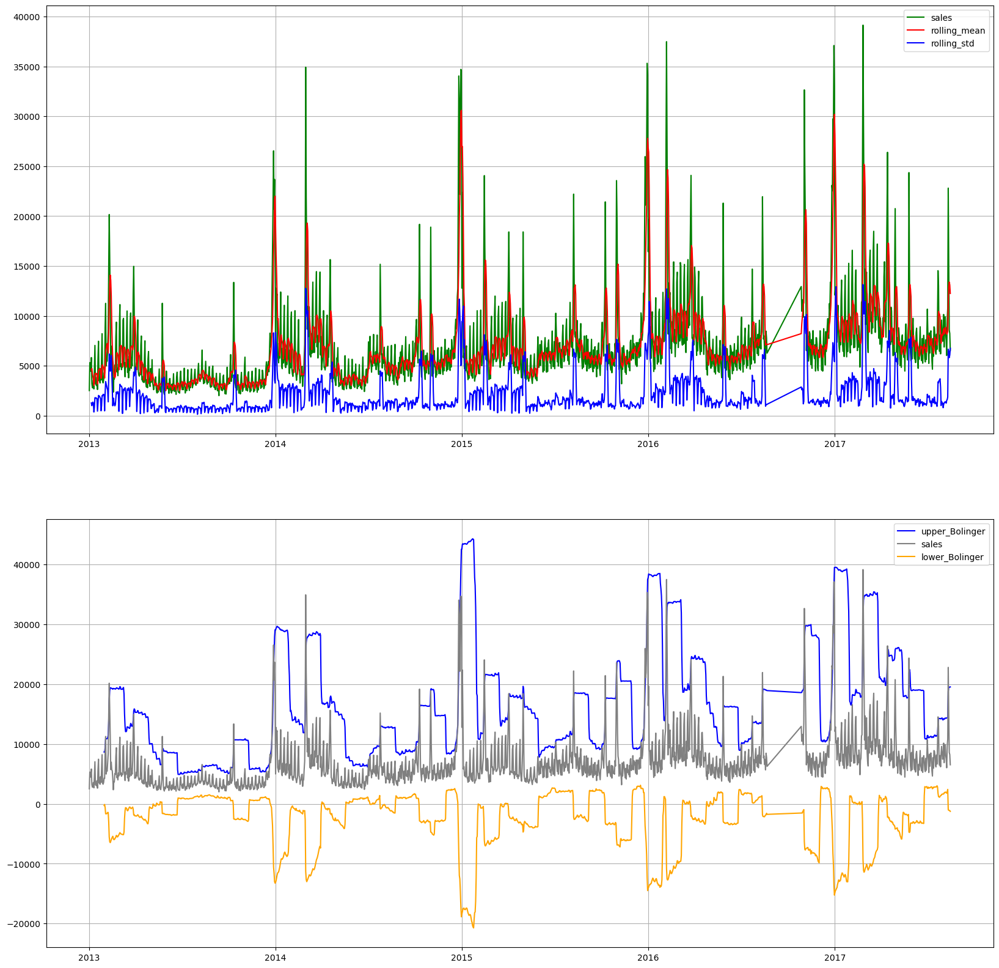

In [34]:
#plt.style.use('dark_background')

fig, ax = plt.subplots(2, 1, figsize=(20, 20))
# sales data 
ax[0].plot(data.index, data.unit_sales, c='g')
ax[0].plot(data.index, data.rolling_mean, c='r')
ax[0].plot(data.index, data.rolling_std, c='b')
ax[0].legend(['sales', 'rolling_mean', 'rolling_std'])
ax[0].grid()

ax[1].plot(data.index, data.upper_Bolinger, c='blue')
ax[1].plot(data.index, data.unit_sales, c='grey')
ax[1].plot(data.index, data.lower_Bolinger, c='orange')
ax[1].legend(['upper_Bolinger', 'sales', 'lower_Bolinger'])
ax[1].grid()
plt.show()

## Simple moving average 10 dots
Task 6 Постройте оконное среднее с окном в 10 точек.

In [35]:
data['rolling_mean_10'] = data.unit_sales.rolling(window=10).mean()

## Exponential moving average

Task 7 Постройте экспоненциально среднее с окном в 7 точек (span=7).

In [36]:
data['rolling_ema_7'] = data.unit_sales.ewm(min_periods=7, span=7).mean()

### Plots 
Task 8 Отобразите их на отдельном графике.

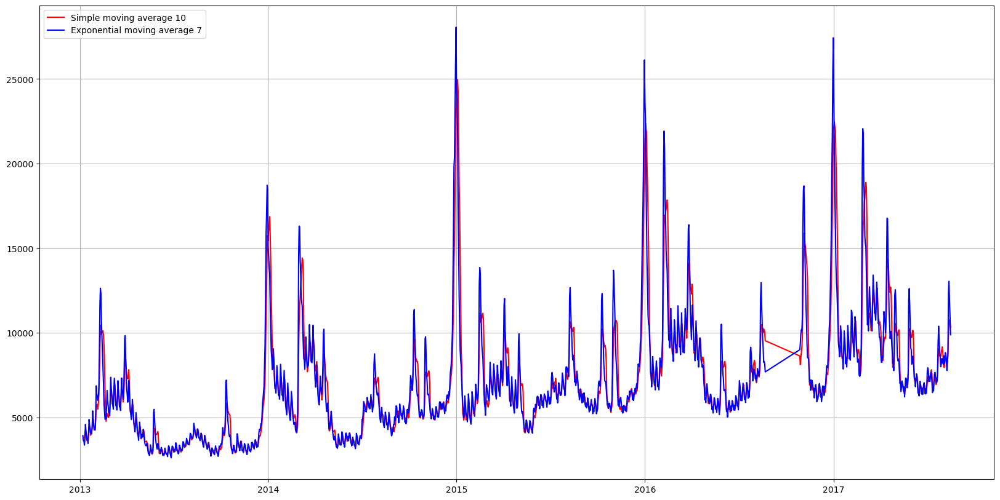

In [37]:
#plt.style.use('dark_background')
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ax.plot(data.index, data.rolling_mean_10, c='red')
ax.plot(data.index, data.rolling_ema_7, c='blue') 
ax.legend(['Simple moving average 10', 'Exponential moving average 7'])

plt.grid()
plt.show()

## Min_max_moving_avg
9 Напишите свою скользящую функцию, которая будет являться средним арифметическим между максимальным и минимальным значением unit_sales, используя окно 10.

In [38]:
def min_max_sma_10(value): 
    """returns simple moving average between max and min of values in window sized 10"""
    min_max_sma_10= (max(value) - min(value)) / 10 
    return min_max_sma_10
    

In [39]:
data['min_max_sma_10'] = data.unit_sales.rolling(window=10).apply(min_max_sma_10, raw=False)

In [40]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

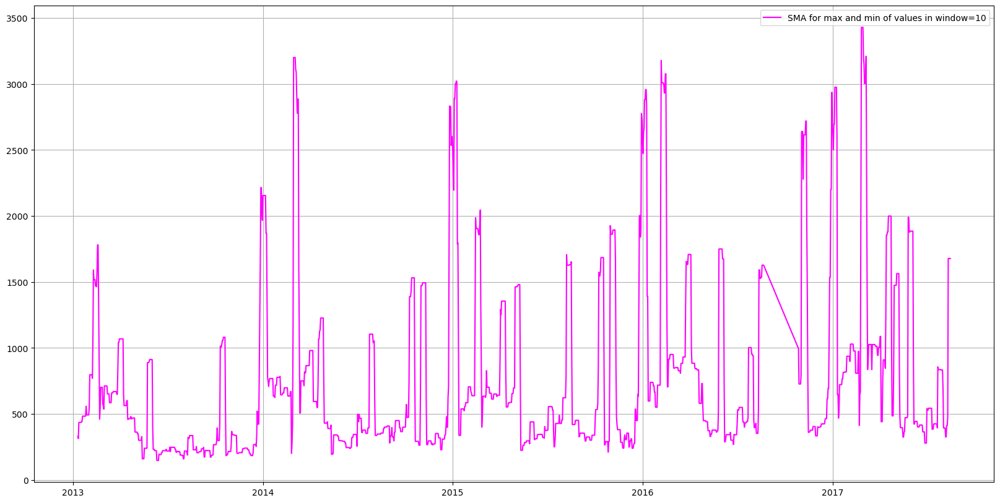

In [41]:
#plt.style.use('fast')
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ax.plot(data.index, data.min_max_sma_10, c='magenta')
ax.legend(["SMA for max and min of values in window=10"])
ax.grid()

## SMA_50 & EMA_10, crosspoints
10 Постройте скользящее среднее с окном 50 и экспоненциальное скользящее среднее с окном 10 (span=10). Укажите индексы датафрейма, на которых одно скользящее пересекается с другим. Для этого вычтите из одно скользящего среднего другое, возьмите знак этой разности (np.sign), продифференциируйте его (diff()) и оставьте только те точки, где результат дифференциирования не равен нулю.

In [42]:
# construction 
data['SMA_50'] = data.unit_sales.rolling(window=50).mean() #скользящее среднее с окном 50
data['EMA_10'] = data.unit_sales.ewm(min_periods=10, span=10).mean() # экспоненциальное скользящее среднее


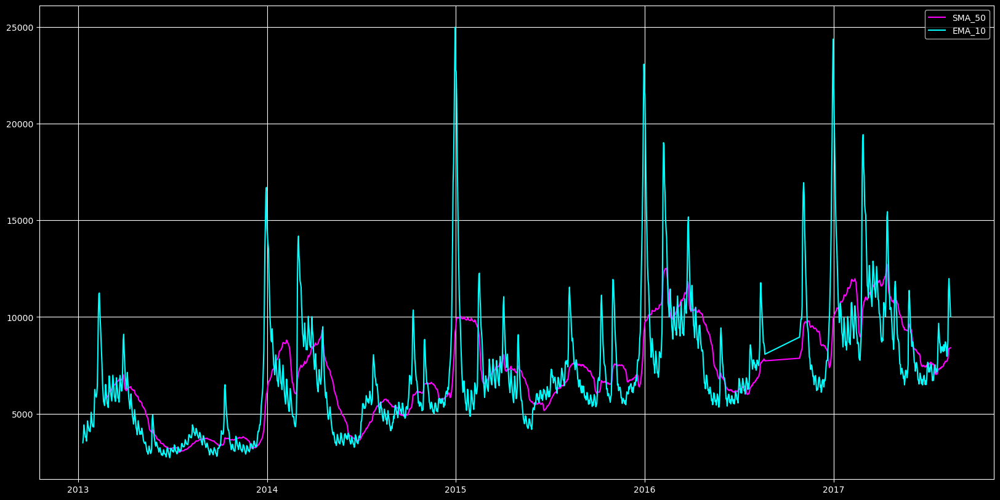

In [43]:
# plotting
plt.style.use('dark_background')
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
#ax.plot(data.index, data.unit_sales, c='green')
ax.plot(data.index, data.SMA_50, c='magenta')
ax.plot(data.index, data.EMA_10, c='cyan')
ax.legend(['SMA_50', 'EMA_10']) #'Sales',
ax.grid()

In [44]:
# index 
x = data.SMA_50
y = data.EMA_10

In [45]:
delta = [x - y,]
sign = np.sign(delta)
crossing = np.diff(sign)

In [46]:
delta

[date
 2013-01-01            NaN
 2013-01-02            NaN
 2013-01-03            NaN
 2013-01-04            NaN
 2013-01-05            NaN
                  ...     
 2017-08-11   -3085.970008
 2017-08-12   -3623.459181
 2017-08-13   -2992.412163
 2017-08-14   -2405.719710
 2017-08-15   -1613.057097
 Length: 1618, dtype: float64]

In [47]:
sign

array([[nan, nan, nan, ..., -1., -1., -1.]])

In [48]:
np.diff(sign)

array([[nan, nan, nan, ...,  0.,  0.,  0.]])

In [49]:
# indexes of non null massive
np.where((crossing != 0) & (~np.isnan(crossing)))[1]

array([  49,   51,   55,   59,   62,   66,   68,   73,   74,   80,   81,
         85,   96,  142,  146,  179,  180,  185,  187,  192,  237,  241,
        243,  273,  292,  304,  305,  332,  337,  338,  378,  380,  381,
        421,  453,  471,  472,  521,  522,  534,  537,  540,  580,  611,
        613,  618,  628,  629,  630,  632,  655,  666,  673,  696,  698,
        702,  703,  709,  736,  771,  782,  785,  787,  792,  795,  799,
        801,  806,  808,  813,  815,  818,  829,  847,  851,  882,  923,
        924,  937,  938,  957,  960,  961, 1002, 1019, 1029, 1039, 1078,
       1101, 1126, 1136, 1140, 1144, 1148, 1150, 1155, 1156, 1174, 1186,
       1190, 1191, 1238, 1248, 1274, 1277, 1280, 1284, 1288, 1340, 1380,
       1400, 1444, 1462, 1465, 1469, 1473, 1475, 1492, 1498, 1508, 1511,
       1535, 1539, 1543, 1545, 1572, 1574, 1585], dtype=int64)

In [50]:
# another way of getting indexes of cross points
np.argwhere((crossing != 0) & (~np.isnan(crossing)))

array([[   0,   49],
       [   0,   51],
       [   0,   55],
       [   0,   59],
       [   0,   62],
       [   0,   66],
       [   0,   68],
       [   0,   73],
       [   0,   74],
       [   0,   80],
       [   0,   81],
       [   0,   85],
       [   0,   96],
       [   0,  142],
       [   0,  146],
       [   0,  179],
       [   0,  180],
       [   0,  185],
       [   0,  187],
       [   0,  192],
       [   0,  237],
       [   0,  241],
       [   0,  243],
       [   0,  273],
       [   0,  292],
       [   0,  304],
       [   0,  305],
       [   0,  332],
       [   0,  337],
       [   0,  338],
       [   0,  378],
       [   0,  380],
       [   0,  381],
       [   0,  421],
       [   0,  453],
       [   0,  471],
       [   0,  472],
       [   0,  521],
       [   0,  522],
       [   0,  534],
       [   0,  537],
       [   0,  540],
       [   0,  580],
       [   0,  611],
       [   0,  613],
       [   0,  618],
       [   0,  628],
       [   0,

## Lags

11 Получите лаговые факторы с 7-го по 10-й предыдущих дня (лаг7, лаг8, лаг9, лаг10) и отобразите на графике. 

Важно! Когда вы разделяете выборку на train и test, помните, что лаговый шаг должен быть больше, чем количество дней в тестовой выборке. Например, если вы строите прогноз на неделю вперед (для дней d1, d2, d3, d4, d5, d6, d7), вы не можете сделать лаг < 7, так как при лаге = 1 вам нужно в качестве признака для позиции d7 указать значение d6, для позиции d6 указать значение d5 и так далее. Но они у вас будут неизвестны, а известными будут данные, которые находятся в обучающей выборке. При лаге = 8 для d7 вы сможете использовать значение, предшествующее d1.

In [51]:
# Lags
for i in range(7, 11):
    data['lag_{}'.format(i)] = data.unit_sales.shift(i)

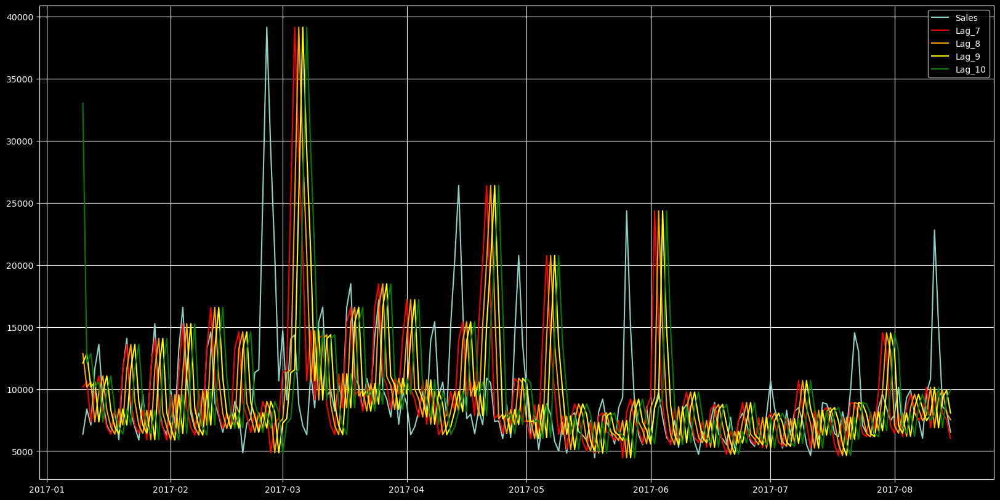

In [52]:
# plots
# для большей наглядности возьмем только фрагмент
data_l = data.iloc[1400:2500]
plt.style.use('dark_background')
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ax.plot(data_l.index, data_l.unit_sales)
ax.plot(data_l.index, data_l.lag_7, c='red')
ax.plot(data_l.index, data_l.lag_8, c='orange')
ax.plot(data_l.index, data_l.lag_9, c='yellow')
ax.plot(data_l.index, data_l.lag_10, c='green')
ax.legend(['Sales', 'Lag_7', 'Lag_8', 'Lag_9', 'Lag_10'])
ax.grid()

# ARIMA  practice

## Data 


1 Выберите продукт с номером 103501 (item_nbr) и приведите данные к виду временного ряда с группировкой по дате и агрегацией .sum()['unit_sales']. 

In [53]:
df.columns

Index(['id', 'date', 'store_nbr', 'item_nbr', 'unit_sales', 'onpromotion'], dtype='object')

In [54]:
data_item = df[df.item_nbr == 103501]

In [55]:
data_item['date'] = pd.to_datetime(data_item['date'])

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\19700077.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_item['date'] = pd.to_datetime(data_item['date'])


In [56]:
data_item = data_item.groupby('date').sum()['unit_sales']

In [57]:
data_item

date
2013-01-02    185.0
2013-01-03    153.0
2013-01-04    155.0
2013-01-05    160.0
2013-01-06    173.0
              ...  
2017-08-11     80.0
2017-08-12     84.0
2017-08-13    103.0
2017-08-14     88.0
2017-08-15     90.0
Name: unit_sales, Length: 1625, dtype: float64

In [58]:
type(data_item)

pandas.core.series.Series

## Imports 

In [59]:
# Stationarity check
from statsmodels.tsa.stattools import adfuller

# metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

#models
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

# visuals
from statsmodels.graphics.tsaplots import plot_predict

## Dickey-Fuller test

2 Проведите тест ADF. Стационарен ли ряд?

In [60]:
X = data_item.values

In [61]:
X

array([185., 153., 155., ..., 103.,  88.,  90.])

In [62]:
result = adfuller(X)
print('ADF statistics: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical values:')
for key, value in result[4].items(): 
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]['5%']:
      print('Hypotesys H0 declined, Time series is stationary')
else: 
      print('Failed to decline hypotesys H0, Time series is non-stationary')

ADF statistics: -4.154403
p-value: 0.000786
Critical values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Hypotesys H0 declined, Time series is stationary


Ряд стационарен, для модели ARIMA  показатель дифференцирования установлен как d=0.


## Prognosing with SMA_6

Task 3 Постройте прогноз методом скользящего среднего с окном 6, как в ноутбуке выше. Посчитайте метрики MSE, MAE, MAPE.

Для оценки качества прогноза отложим 6 дней - период, равный размеру окна расчета среднего.

In [63]:
days_aside = 6 # отложенный для проведения оценки период 
window_size = 6 # Размер окна для расчета среднего

In [64]:
def SMA_forecast(time_series, window_size):
    """Function returning a forecast formed by simple moving average """
    forecast = []
    for moment in range(len(time_series) - window_size):
        forecast.append(time_series[moment:moment + window_size].mean())
    return np.array(forecast)

In [65]:
shown_train_size = days_aside * 3
sma = SMA_forecast(data_item, window_size)

In [66]:
sma

array([154.        , 140.33333333, 126.66666667, ...,  82.16666667,
        84.        ,  83.33333333])

In [67]:
sma = pd.Series(sma, index=data_item[days_aside:].index)

In [68]:
print(sma[-days_aside:].shape,
      data_item[-days_aside:].shape)

(6,) (6,)


###  Metrics

In [69]:
mse = mean_squared_error(data_item.values[-days_aside:], sma[-days_aside:])
mae = mean_absolute_error(data_item.values[-days_aside:], sma[-days_aside:])
mape = mean_absolute_percentage_error(data_item.values[-days_aside:], sma[-days_aside:])

In [70]:
print(" Mean squared error:", mse, '\n', "Mean absolute error:",
      mae, '\n', "Mean absolute percentage error:", mape)

 Mean squared error: 287.087962962963 
 Mean absolute error: 13.416666666666666 
 Mean absolute percentage error: 0.17213844967435177


### Plots

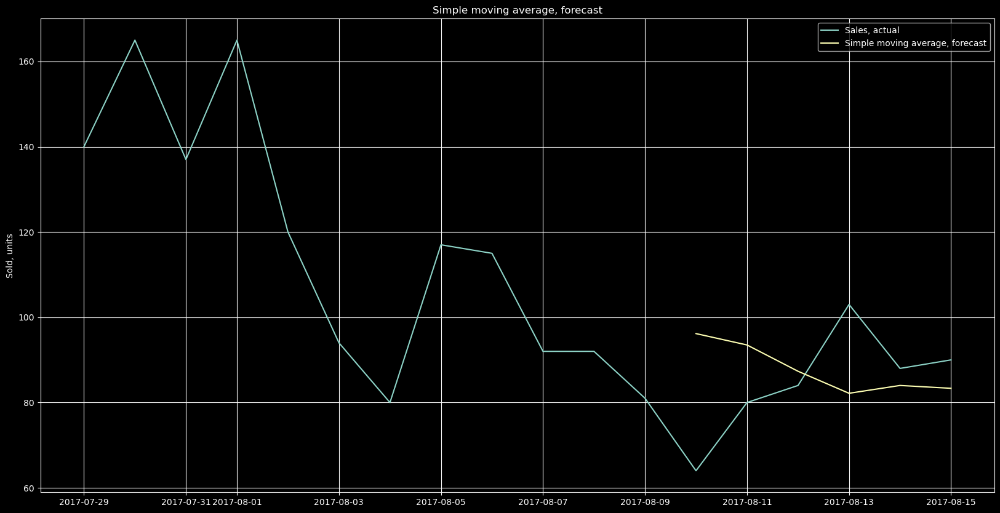

In [71]:
fig, ax = plt.subplots(1, 1, figsize = (20, 10))
ax.plot(data_item[-shown_train_size:], label = 'Sales, actual')
ax.plot(sma[-days_aside:], label='Simple moving average, forecast')
ax.grid()
plt.title('Simple moving average, forecast')
plt.ylabel('Sold, units')
ax.legend(loc='upper right')

## Lags

Task 4 Сделайте лаги с 1 по 6. 

Обратите внимание: если на реальных данных вам нужно будет предсказывать, например, на 100 дней вперёд, вы не сможете взять лаги с 1 по 6, но сможете лишь с 100-го дня. (поскольку для 99 дня нельзя получить лаги с 1 по 99 — эти значения в будущем не известны).

In [72]:
lags = pd.DataFrame() 
lags['sales'] = data_item
lags['lag_1'] = lags['sales'].shift(1)
lags['lag_2'] = lags['sales'].shift(2)
lags['lag_3'] = lags['sales'].shift(3)
lags['lag_4'] = lags['sales'].shift(4)
lags['lag_5'] = lags['sales'].shift(5)
lags['lag_6'] = lags['sales'].shift(6)
lags.dropna(inplace=True)

In [73]:
lags

,sales,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
date,,,,,,,
2013-01-08,103.0,98.0,173.0,160.0,155.0,153.0,185.0
2013-01-09,71.0,103.0,98.0,173.0,160.0,155.0,153.0
2013-01-10,83.0,71.0,103.0,98.0,173.0,160.0,155.0
2013-01-11,91.0,83.0,71.0,103.0,98.0,173.0,160.0
2013-01-12,118.0,91.0,83.0,71.0,103.0,98.0,173.0
...,...,...,...,...,...,...,...
2017-08-11,80.0,64.0,81.0,92.0,92.0,115.0,117.0
2017-08-12,84.0,80.0,64.0,81.0,92.0,92.0,115.0
2017-08-13,103.0,84.0,80.0,64.0,81.0,92.0,92.0


## Split


5 Отложите 1-2 последних дня в тестовую выборку для совершения предсказания.

In [74]:
prediction_size = 2
x_train = lags[:-prediction_size].drop(['sales'], axis=1) 
y_train = lags[:-prediction_size]['sales']
x_test= lags[-prediction_size:].drop(['sales'], axis=1) 
y_test = lags[-prediction_size:]['sales']

## Linear model 

In [75]:
regressor = LinearRegression()

In [76]:
regressor.fit(x_train, y_train)

LinearRegression()

### Predictions, metrics

Task 6 Сделайте прогноз линейной регрессией, посчитайте значения метрик MSE, MAE, MAPE.

In [77]:
lr_predictions  = pd.Series(regressor.predict(x_test), index=x_test.index)

In [78]:
lr_predictions.shape

(2,)

In [79]:
print('MSE', mean_squared_error(y_test, lr_predictions))
print('MAE', mean_absolute_error(y_test, lr_predictions))
print('MAPE', mean_absolute_percentage_error(y_test, lr_predictions))

MSE 107.8901617381196
MAE 7.8986932308730715
MAPE 0.08961226340234724


## p & q 

Task 7 Определите p и q.

ARIMA — модель авторегрессии и скользящего среднего. В ней p авторегрессионных слагаемых и q слагаемых скользящего среднего шумовой компоненты.

ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов, сильно отличных от 0, 
в модели MA.

PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

Чтобы построить соответствующие коррелограммы, в пакете statsmodels имеются следующие функции: plot_acf() и plot_pacf(). Они выводят графики ACF и PACF, у которых по оси X откладываются номера лагов, а по оси Y значения соответствующих функций. Нужно отметить, что количество лагов в функциях и определяет число значимых коэффициентов.

In [80]:
data_item.values.squeeze()

array([185., 153., 155., ..., 103.,  88.,  90.])

C:\Users\ElenaS\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


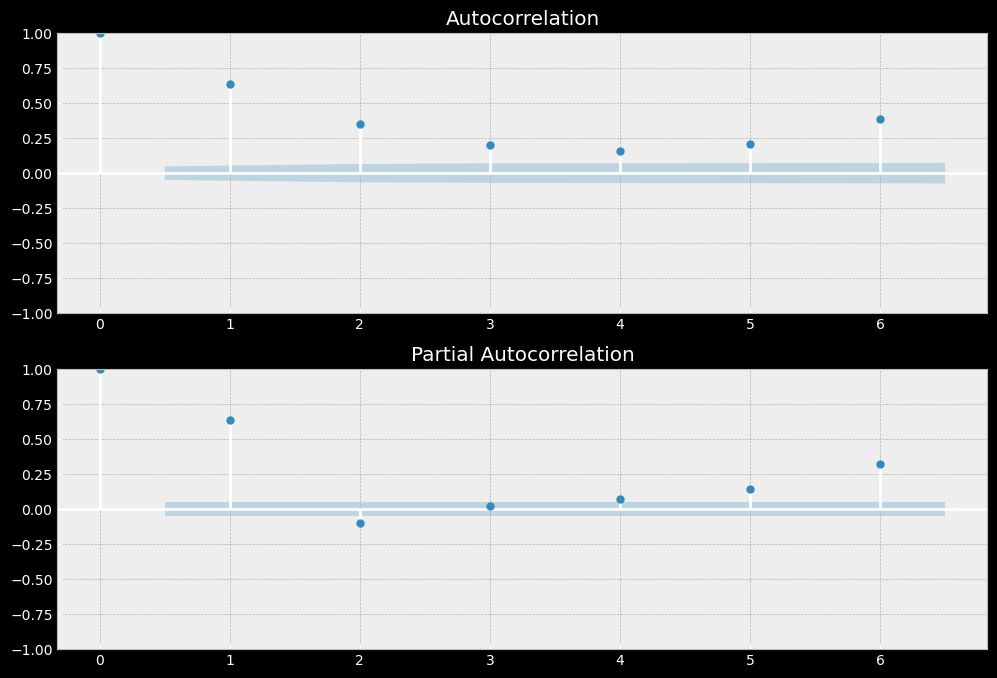

In [81]:
fig = plt.figure(figsize=(12,8))
plt.style.use('bmh')
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data_item.values, lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data_item, lags=6, ax=ax2)

ACF визуализация показывает, что есть 6 автокорреляционных коэффициентов, сильно отличных от нуля. q = 6

PACF  показывает на 6-ом лаге сильный рост, значит, p = 6

## ARIMA model



Task 8. Постройте ARIMA, сравните метрики.

In [82]:
arima_predictor = ARIMA(y_train.values.reshape(-1), order = (6, 0, 6))

In [83]:
train_size = len(y_train)

In [84]:
test_size = prediction_size

In [85]:
arima_forecast = arima_predictor.fit().predict(start=train_size, end=train_size+test_size - 1, dynamic=False)

C:\Users\ElenaS\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\ElenaS\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\ElenaS\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


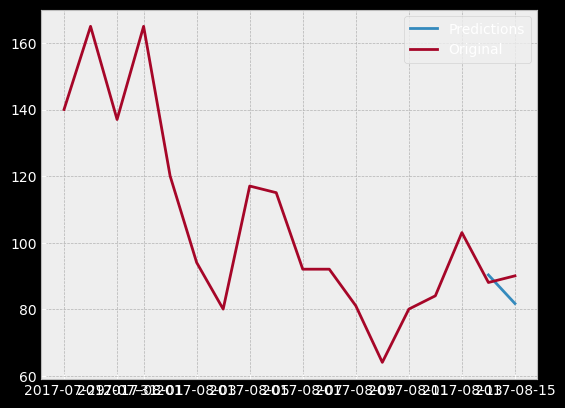

In [86]:
plt.plot(pd.Series(arima_forecast, index=y_test.index), label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right")

In [87]:
print('mean squared error',mean_squared_error(y_test, arima_forecast))
print('mean absolute error',mean_absolute_error(y_test, arima_forecast))
print('mean absolute percentage error', mean_absolute_percentage_error(y_test, arima_forecast))

mean squared error 37.20335260948724
mean absolute error 5.2989100510175575
mean absolute percentage error 0.059164425352457264


## Conclusions 
 Task 9. Сделайте вывод.

Модель ARIMA  показала наилучший прогноз в разрезе величины ошибки по трем применявшимся метрикам: 
 - MSE, 
 - MAE, 
 - MAPE

в сравнении с прогнозами, построенными на основании:
 - простого скользящего среднего с окном 6;
 - линейной регрессии. 

# FPProphet

## Imports 

In [88]:
# visuals
import plotly.offline as py 
import plotly.graph_objs as go
py.init_notebook_mode() 

# forecasting 
from fbprophet import Prophet 

%time data_holidays = pd.read_csv('holidays_events.csv')

print('Data & libraries are loaded.') 

CPU times: total: 15.6 ms
Wall time: 425 ms
Data & libraries are loaded.


## Data

Task 1. 

Приведите данные train.csv к виду временного ряда, сгруппированного по дате, с агрегирующей функцией sum() для столбца unit_sales. У вас должен получиться временной ряд с двумя столбцами: дата и sum_unit_sales. Отобразите на графике. Видно ли влияние сезонности и других факторов на количество покупок?

In [89]:
df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN
...,...,...,...,...,...,...
125497035,125497035,2017-08-15,54,2089339,4.0,False
125497036,125497036,2017-08-15,54,2106464,1.0,True
125497037,125497037,2017-08-15,54,2110456,192.0,False
125497038,125497038,2017-08-15,54,2113914,198.0,True


In [90]:
df.columns.to_list()

['id', 'date', 'store_nbr', 'item_nbr', 'unit_sales', 'onpromotion']

In [91]:
drop_list = ['id', 'store_nbr', 'item_nbr', 'onpromotion']

In [92]:
data = df.drop(columns = drop_list, axis=1)

In [93]:
data

,date,unit_sales
0,2013-01-01,7.0
1,2013-01-01,1.0
2,2013-01-01,2.0
3,2013-01-01,1.0
4,2013-01-01,1.0
...,...,...
125497035,2017-08-15,4.0
125497036,2017-08-15,1.0
125497037,2017-08-15,192.0
125497038,2017-08-15,198.0


In [94]:
data_sales = data.groupby('date')['unit_sales'].sum()#.reset_index()

In [95]:
data_sales

date
2013-01-01      2511.619
2013-01-02    496092.418
2013-01-03    361429.231
2013-01-04    354459.677
2013-01-05    477350.121
                 ...    
2017-08-11    826373.722
2017-08-12    792630.535
2017-08-13    865639.677
2017-08-14    760922.406
2017-08-15    762661.936
Name: unit_sales, Length: 1684, dtype: float64

### Plot

In [96]:
py.iplot([go.Scatter(x=data_sales.index, y=data_sales)])

Хорошо заметен общий тренд роста, влияние сезонности. 

## Prophet forecast

Task 2. 
Попробуйте выполнить предсказание пророком (prophet) на год вперёд (periods=365). Отобразите на графике. Посчитайте RSME.

Prophet следует API модели sklearn. Мы создаем экземпляр класса Prophet, а затем вызываем его методы соответствия и прогнозирования. Входными данными для Prophet всегда является фрейм данных с двумя столбцами: ** ds ** и ** y *. Столбец ds (отметка даты) должен содержать дату или дату и время (это нормально). Столбец * y ** должен быть числовым и представлять измерение, которое мы хотим спрогнозировать.

###  pre_forecast data prep 


In [97]:
data_sales = pd.DataFrame(data_sales).reset_index() 

In [98]:
data_sales.columns = ['ds', 'y']
data_sales

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


###  Forecast

In [99]:
predictor = Prophet() 
predictor.fit(data_sales)
future = predictor.make_future_dataframe(periods=365)
forecast = predictor.predict(future)
forecast 

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,332114.062111,250472.902366,5.089285e+05,332114.062111,3.321141e+05,43664.550649,43664.550649,43664.550649,-68156.883976,-68156.883976,-68156.883976,111821.434625,111821.434625,111821.434625,0.0,0.0,0.0,3.757786e+05
1,2013-01-02,332493.518831,242938.365512,5.322810e+05,332493.518831,3.324935e+05,55739.408111,55739.408111,55739.408111,-44192.382164,-44192.382164,-44192.382164,99931.790276,99931.790276,99931.790276,0.0,0.0,0.0,3.882329e+05
2,2013-01-03,332872.975551,148449.664012,4.268619e+05,332872.975551,3.328730e+05,-43855.342746,-43855.342746,-43855.342746,-131877.344814,-131877.344814,-131877.344814,88022.002068,88022.002068,88022.002068,0.0,0.0,0.0,2.890176e+05
3,2013-01-04,333252.432271,207605.856394,4.817792e+05,333252.432271,3.332524e+05,19241.528060,19241.528060,19241.528060,-57028.521302,-57028.521302,-57028.521302,76270.049362,76270.049362,76270.049362,0.0,0.0,0.0,3.524940e+05
4,2013-01-05,333631.888990,392460.186939,6.697844e+05,333631.888990,3.336319e+05,198845.734957,198845.734957,198845.734957,134001.909925,134001.909925,134001.909925,64843.825032,64843.825032,64843.825032,0.0,0.0,0.0,5.324776e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,996967.858867,899906.089463,1.199091e+06,943476.433442,1.054319e+06,62297.502921,62297.502921,62297.502921,134001.909925,134001.909925,134001.909925,-71704.407004,-71704.407004,-71704.407004,0.0,0.0,0.0,1.059265e+06
2045,2018-08-12,997243.261313,971772.459549,1.262182e+06,943586.989076,1.054764e+06,116212.910368,116212.910368,116212.910368,188397.998502,188397.998502,188397.998502,-72185.088134,-72185.088134,-72185.088134,0.0,0.0,0.0,1.113456e+06
2046,2018-08-13,997518.663759,752343.462178,1.043240e+06,943697.544710,1.055209e+06,-93148.935037,-93148.935037,-93148.935037,-21144.776172,-21144.776172,-21144.776172,-72004.158865,-72004.158865,-72004.158865,0.0,0.0,0.0,9.043697e+05
2047,2018-08-14,997794.066205,712988.365074,1.009582e+06,943742.782825,1.055654e+06,-139320.375212,-139320.375212,-139320.375212,-68156.883976,-68156.883976,-68156.883976,-71163.491237,-71163.491237,-71163.491237,0.0,0.0,0.0,8.584737e+05


### Plot

In [100]:
py.iplot([
    go.Scatter(x=data_sales['ds'], y=data_sales['y'], name='y'),# sales line
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'), 
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='trend')
])

### Metrics

In [101]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-data_sales['y'])**2)) )

RMSE: 107831.725704


###  Change_point experiments

Task 3.
Поэкспериментируйте с коэффициентом changepoint_prior_scale (переберите 3-5 значений, больше/меньше 0,5) и посмотрите, как изменится тренд. В какую сторону необходимо двигать коэффициент? Тренд переобучен или недообучен?

Исходя из визуализации выше, коэффициент change_point нужно увеличивать, тренд ведет себя как кусочно-линейная функция, негибко реагируя на периоды изменений показателя. 

In [102]:
points = [0.1, 0.25, 1, 2.5, 3, 3.5]
for point in points: 
    m = Prophet(changepoint_prior_scale=point) 
    m.fit(data_sales)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    print('Changepoint: %f' % point, 'RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-data_sales['y'])**2)))
    

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Changepoint: 0.100000 RMSE: 104594.313136


C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Changepoint: 0.250000 RMSE: 100037.642759


C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Changepoint: 1.000000 RMSE: 97803.770588


C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Changepoint: 2.500000 RMSE: 97437.386652


C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Changepoint: 3.000000 RMSE: 97423.132355


C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Changepoint: 3.500000 RMSE: 97439.182554


### Plot 

Task 4. 


Отобразите результаты с подобранным коэффициентом на графике. Как изменилась ошибка?

In [103]:
best_point = 3
m = Prophet(changepoint_prior_scale=best_point)
m.fit(data_sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)



INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [104]:
py.iplot([
    go.Scatter(x=data_sales['ds'], y=data_sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [105]:
np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-data_sales['y'])**2))

97423.13235485299

Ошибка RMSE: 97423.132355,  уменьшилась по сравнению с RMSE, полученной при значении change_point по умолчанию. 
Тренд стал более гибким, отслеживающим основные периоды изменения.


## Seasonallity

Task 5.

Добавьте в модель месячную сезонность (name='monthly', period=30.5, fourier_order=5). Как изменилась ошибка? Улучшилась ли модель? Отобразите на графике. Посчитайте ошибку.

In [106]:
model = Prophet(changepoint_prior_scale=3)
model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
model.fit(data_sales)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [107]:
print("RSME: %f" % np.sqrt(np.mean((forecast.loc[:1684, 'yhat'] - data_sales['y'])**2)))
py.iplot([
    go.Scatter(x=data_sales['ds'], y=data_sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'), 
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RSME: 90875.550856


Добавление месячной сезонности позволило еще уменьшить RMSE, заставить тренд точнее отражать периоды колебаний. Но хорошо видно, что прогнозные значения объема продаж пропускают резкие провалы и пики роста, связанные, вероятно с поведением спроса вблизи дат праздников и выходных. 

## Holidays

Task 6. 

Улучшите модель добавлением данных о праздниках. Отобразите результат, сделайте письменный вывод.

Сначала нам нужно настроить формат данных. Пророку нужны два столбца (праздник и ds) и строка для каждого наступления праздника. Так же можно включить столбцы lower_window и upper_window, которые продлевают праздничные дни до дней «[lower_window, upper_window]» вокруг даты. 

In [108]:
holidays_data = pd.read_csv('holidays_events.csv')

In [109]:
holidays = holidays_data[holidays_data['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
#holidays['lower_window'] = -4
#holidays['upper_window'] = 4
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [110]:
model = Prophet(changepoint_prior_scale=3, holidays=holidays)
model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
model.fit(data_sales)
future = model.make_future_dataframe(periods=365)
forecast=model.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ElenaS\anaconda3\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Plots  

In [111]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-data_sales['y'])**2)) )
py.iplot([
    go.Scatter(x=data_sales['ds'], y=data_sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 74139.142089


RMSE: 74139.142089

### Conclusions

Модель теперь занчительно лучше отслеживает пики и провалы продаж. По сравнению  с базовыми прогнозами, удалось значительно уменьшить метрику прогноза RMSE, добавив в модель учет месячной сезонности и данные о праздниках.

Чтобы понять, что происходит с прогнозом в январских провалах последних двух лет, посмотрим детально на праздничные дни в эти периоды.

In [112]:
holidays[holidays['ds'] == '2014-12-31']

,holiday,ds
158,Primer dia del ano-1,2014-12-31


In [113]:
holidays.loc[158:165]

,holiday,ds
158,Primer dia del ano-1,2014-12-31
159,Primer dia del ano,2015-01-01
160,Puente Primer dia del ano,2015-01-02
161,Recupero Puente Primer dia del ano,2015-01-10
162,Carnaval,2015-02-16
163,Carnaval,2015-02-17
164,Fundacion de Manta,2015-03-02
165,Provincializacion de Cotopaxi,2015-04-01


In [114]:
holidays.loc[207:215]

,holiday,ds
207,Navidad-1,2015-12-24
208,Navidad,2015-12-25
209,Navidad+1,2015-12-26
210,Primer dia del ano-1,2015-12-31
211,Primer dia del ano,2016-01-01
212,Carnaval,2016-02-08
213,Carnaval,2016-02-09
214,Fundacion de Manta,2016-03-02
215,Viernes Santo,2016-03-25


In [115]:
holidays.loc[296:300]

,holiday,ds
296,Primer dia del ano-1,2016-12-31
298,Traslado Primer dia del ano,2017-01-02
299,Carnaval,2017-02-27
300,Carnaval,2017-02-28


Наша модель демонстрирует заметную разницу прогнозных значений от фактических продаж на первых числах января 2016 и 2017 года, что связано с изменением календаря праздников от 2015 года до 2017 года. Тем не менее, объем продаж в окрестностях даты католического рождества определены точно, прогноз с 15 августа до декабрьских католических праздников тоже выглядит правдоподобно. 

Для получения более точного прогноза на дальнейшие даты необходимы дополнительные данные по продажам, дополненные календарем праздничных и выходных дней на соответствующий период.

# Boostings / trees

## Imports

In [116]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor
import seaborn as sns

## Data

Для исследования будем использовать данные о суммарных продажах по датам из датасета train.

In [117]:
sales_df = data.groupby('date')['unit_sales'].sum()

In [118]:
sales_df

date
2013-01-01      2511.619
2013-01-02    496092.418
2013-01-03    361429.231
2013-01-04    354459.677
2013-01-05    477350.121
                 ...    
2017-08-11    826373.722
2017-08-12    792630.535
2017-08-13    865639.677
2017-08-14    760922.406
2017-08-15    762661.936
Name: unit_sales, Length: 1684, dtype: float64

In [119]:
py.iplot([
    go.Scatter(x=sales_df.index, y=sales_df)
])

In [120]:
# for further usability let's write sales_df Series to Pandas dataframe
sales_df = pd.DataFrame(sales_df)

# date format clearing
sales_df['date'] = pd.to_datetime(sales_df.index)

In [121]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1684 entries, 2013-01-01 to 2017-08-15
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   unit_sales  1684 non-null   float64       
 1   date        1684 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 104.0+ KB


## Train / test split
1 Правильным образом разбейте данные на train и test.

Для проверки прогнозирования от набора данных отрежем данные, начиная с 2016 года.

In [122]:
split_day = '2016-01-01'
train_sales = sales_df.loc[sales_df.date <= split_day].copy()
test_sales = sales_df.loc[sales_df.date > split_day].copy()


In [123]:
py.iplot([
    go.Scatter(x=train_sales.date, y=train_sales.unit_sales, name='Train data'), 
    go.Scatter(x=test_sales.date, y=test_sales.unit_sales, name='Test data')
])

## Feature engineering
2 Создайте временные признаки от datetime.

In [124]:
def create_features(df, label=None):
    """creation of features based on datetime index of df: 
    day of week, quarter, month, year, day of year, day of month, week of year and defining label
    """
    df['day_of_week'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['day_of_year'] = df['date'].dt.dayofyear
    df['day_of_month'] = df['date'].dt.day
    df['week_of_year'] = df['date'].dt.weekofyear

    X = df[['day_of_week', 'quarter', 'month', 'year',
            'day_of_year', 'day_of_month', 'week_of_year']]
    
    if label: 
        y = df[label]
        return X, y
    return X

In [125]:
X_train, y_train = create_features(train_sales, label='unit_sales')
X_test, y_test = create_features(test_sales, label='unit_sales')

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\1982081972.py:11: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\1982081972.py:11: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



## XGBoost & CatBoost

3 Инициализируйте модели XGBoost и CatBoost.


In [126]:
regressor_xgb = xgb.XGBRegressor(n_estimators=1000)


In [127]:
regressor_cbr = CatBoostRegressor(n_estimators=1000)


### Fitting
4 Обучите модели.

In [128]:
regressor_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

C:\Users\ElenaS\anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

In [129]:
regressor_cbr.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

### Feature importances
5 Отобразите важность признаков, сделайте вывод.

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

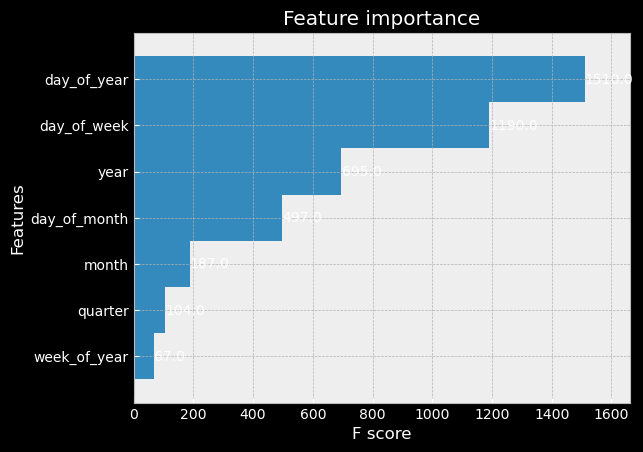

In [130]:
plot_importance(regressor_xgb, height=1)

In [131]:
regressor_cbr.get_feature_importance()

array([27.2657865 ,  5.60823968,  8.40545157, 37.71651515, 10.73818311,
        5.55995912,  4.70586486])

In [132]:
regressor_cbr.feature_names_

['day_of_week',
 'quarter',
 'month',
 'year',
 'day_of_year',
 'day_of_month',
 'week_of_year']

In [133]:
def plot_feature_importance(importance, names, model_type):
    """Function returns a visualisation of feature importances of a Boost regressor. 
    Seaborn as sns, Pandas as pd and numpy as np should be imported beforehand.
    """

    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    # Create a DataFrame using a Dictionary
    data = {
        'feature_names': feature_names,
        'feature_importance': feature_importance
    }
    fi_df = pd.DataFrame(data)

    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)

    # Define size of bar plot
    plt.figure(figsize=(10, 8))
    
    # Plot Seaborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    # Add chart labels
    plt.title(model_type + ' feature importance')
    plt.xlabel('Feature importance')
    plt.ylabel('Feature names')

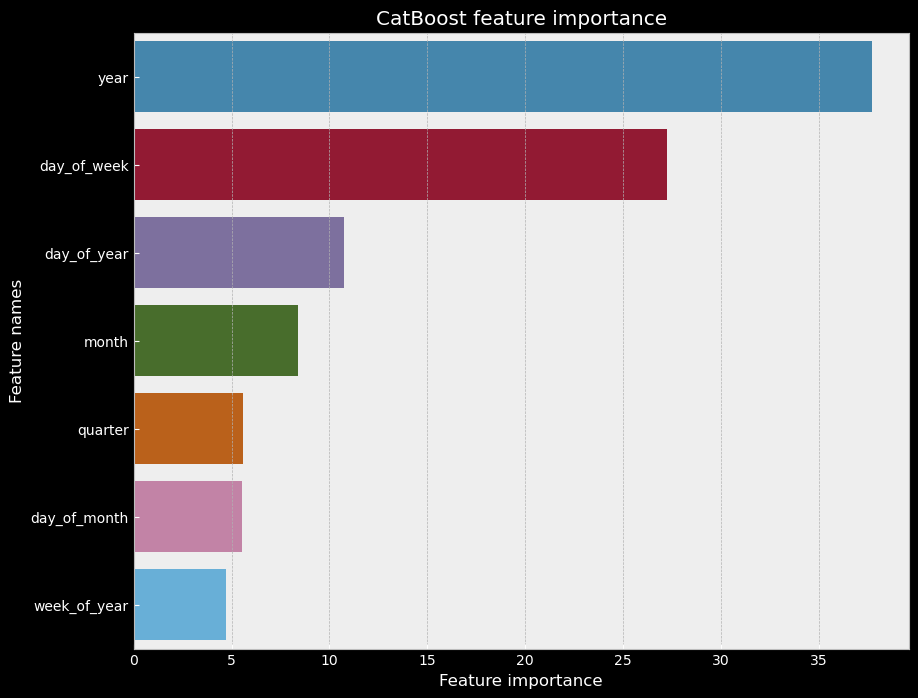

In [134]:
#plot the catboost result
plot_feature_importance(regressor_cbr.get_feature_importance(),X_train.columns,'CatBoost')

XGBoost  регрессор выделяет как наиболее важный признак day_of_year, CatBoost  - year, 
для выбора оптимальной модели необходима оценка метрик качества.

### Predictions
6 Сделайте прогноз и отобразите результат на графике.

In [135]:
xgb_prediction = regressor_xgb.predict(X_test)
ctb_prediction = regressor_cbr.predict(X_test)
#sales_all = pd.concat([train_sales, test_sales], sort=False)

### Plot

In [136]:
py.iplot([
    go.Scatter(x=test_sales['date'], y=test_sales['unit_sales'], name='Sales'), 
    go.Scatter(x=test_sales['date'], y=xgb_prediction, name='XGB forecast'), 
    go.Scatter(x=test_sales['date'], y=ctb_prediction, name='CatBoost forecast')
])

### Metrics
7 Оцените метрики MAE, MAPE, MSE по результатам двух моделей. Сравните, сделайте вывод.

In [137]:
test_sales.columns

Index(['unit_sales', 'date', 'day_of_week', 'quarter', 'month', 'year',
       'day_of_year', 'day_of_month', 'week_of_year'],
      dtype='object')

In [138]:
xgb_mse = mean_squared_error(y_true=y_test, y_pred=xgb_prediction)
xgb_mape = mean_absolute_percentage_error(y_true=y_test, y_pred=xgb_prediction)
xgb_mae = mean_absolute_error(y_true=y_test, y_pred=xgb_prediction)


print(f'''xgb_mse: {xgb_mse}
xgb_mape: {xgb_mape}
xgb_mae: {xgb_mae}''')


xgb_mse: 61906229141.88579
xgb_mape: 0.3237158594923706
xgb_mae: 195362.5420791032


In [139]:
ctb_mse = mean_squared_error(y_true=y_test, y_pred=ctb_prediction)
ctb_mae = mean_absolute_error(y_true=y_test, y_pred=ctb_prediction)
ctb_mape = mean_absolute_percentage_error(y_true=y_test, y_pred=ctb_prediction)

print(f'''ctb_mse: {ctb_mse}
ctb_mape: {ctb_mape}
ctb_mae: {ctb_mae}''')

ctb_mse: 61020426022.16557
ctb_mape: 0.29035126891013957
ctb_mae: 195731.2449943793


Обе модели демонстрируют очень схожие показатели метрик. Попробуем добавить признак выходного дня.  

## data addition: holidays
8 Добавьте данные о праздничных днях. Можно использовать библиотеку holidays.

Для дополнения датасета информацией о праздниках будем использовать сет holidays_events.csv, что уже пробовали для улучшения прогнозирования prophet выше в ноутбуке.

Установим 1 для даты, если это выходной.

In [140]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 338 entries, 0 to 349
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   holiday  338 non-null    object        
 1   ds       338 non-null    datetime64[ns]
dtypes: datetime64[ns](1), object(1)
memory usage: 16.0+ KB


In [141]:
holidays_flags = holidays.ds.values

In [142]:
holidays_flags

array(['2012-03-02T00:00:00.000000000', '2012-04-01T00:00:00.000000000',
       '2012-04-12T00:00:00.000000000', '2012-04-14T00:00:00.000000000',
       '2012-04-21T00:00:00.000000000', '2012-05-12T00:00:00.000000000',
       '2012-06-23T00:00:00.000000000', '2012-06-25T00:00:00.000000000',
       '2012-06-25T00:00:00.000000000', '2012-06-25T00:00:00.000000000',
       '2012-07-03T00:00:00.000000000', '2012-07-03T00:00:00.000000000',
       '2012-07-23T00:00:00.000000000', '2012-08-05T00:00:00.000000000',
       '2012-08-10T00:00:00.000000000', '2012-08-15T00:00:00.000000000',
       '2012-08-24T00:00:00.000000000', '2012-09-28T00:00:00.000000000',
       '2012-10-07T00:00:00.000000000', '2012-10-12T00:00:00.000000000',
       '2012-11-02T00:00:00.000000000', '2012-11-03T00:00:00.000000000',
       '2012-11-06T00:00:00.000000000', '2012-11-07T00:00:00.000000000',
       '2012-11-10T00:00:00.000000000', '2012-11-11T00:00:00.000000000',
       '2012-11-12T00:00:00.000000000', '2012-12-05

In [143]:
def get_holiday_flag(date):
    "func to returns 1 if date is a holiday or 0 if it's not"
    if date in holidays_flags:
        return 1
    else: return 0

In [144]:
date = pd.to_datetime('2017-12-23')

In [145]:
assert(get_holiday_flag(date))

In [146]:
def create_features_holidays(df, label=None):
    """creation of features based on datetime index of df: 
    day of week, quarter, month, year, day of year, day of month, week of year; showing if a day is a holiday or not 
    and defining label
    """
    
    df['day_of_week'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['day_of_year'] = df['date'].dt.dayofyear
    df['day_of_month'] = df['date'].dt.day
    df['week_of_year'] = df['date'].dt.weekofyear
    
    # holidays addition
    df['is_holiday'] = df['date'].apply(get_holiday_flag) 

    X = df[['day_of_week', 'quarter', 'month', 'year',
            'day_of_year', 'day_of_month', 'week_of_year', 'is_holiday']]
    
    if label: 
        y = df[label]
        return X, y
    return X

In [147]:
train_sales.date

date
2013-01-01   2013-01-01
2013-01-02   2013-01-02
2013-01-03   2013-01-03
2013-01-04   2013-01-04
2013-01-05   2013-01-05
                ...    
2015-12-28   2015-12-28
2015-12-29   2015-12-29
2015-12-30   2015-12-30
2015-12-31   2015-12-31
2016-01-01   2016-01-01
Name: date, Length: 1093, dtype: datetime64[ns]

In [148]:
X_train, y_train = create_features_holidays(train_sales, label='unit_sales')
X_test, y_test = create_features_holidays(test_sales, label='unit_sales')

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\844465189.py:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\844465189.py:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



In [149]:
X_train.is_holiday.value_counts()


0    942
1    151
Name: is_holiday, dtype: int64

In [150]:
regressor_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

C:\Users\ElenaS\anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

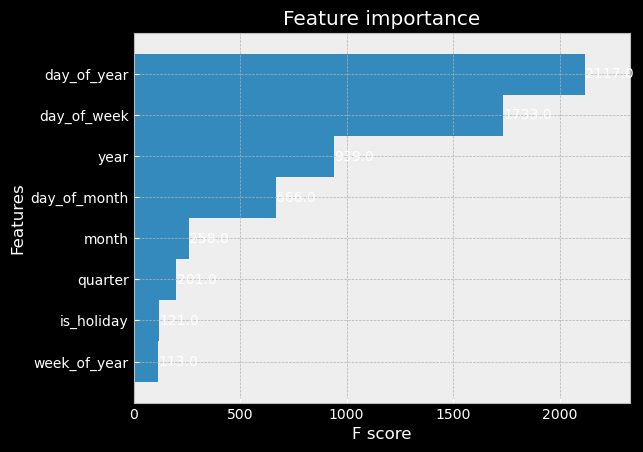

In [151]:
plot_importance(regressor_xgb, height=1)

In [152]:
X_test

,day_of_week,quarter,month,year,day_of_year,day_of_month,week_of_year,is_holiday
date,,,,,,,,
2016-01-02,5,1,1,2016,2,2,53,0
2016-01-03,6,1,1,2016,3,3,53,0
2016-01-04,0,1,1,2016,4,4,1,0
2016-01-05,1,1,1,2016,5,5,1,0
2016-01-06,2,1,1,2016,6,6,1,0
...,...,...,...,...,...,...,...,...
2017-08-11,4,3,8,2017,223,11,32,1
2017-08-12,5,3,8,2017,224,12,32,0
2017-08-13,6,3,8,2017,225,13,32,0


In [153]:
regressor_cbr.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

In [154]:
xgb_prediction_h = regressor_xgb.predict(X_test)
ctb_prediction_h = regressor_cbr.predict(X_test)

### Metrics

In [155]:
xgb_mse_h = mean_squared_error(y_true=y_test, y_pred=xgb_prediction_h)
xgb_mape_h = mean_absolute_percentage_error(y_true=y_test, y_pred=xgb_prediction_h)
xgb_mae_h = mean_absolute_error(y_true=y_test, y_pred=xgb_prediction_h)


print(f'''xgb_mse_h: {xgb_mse_h}
xgb_mape_h: {xgb_mape_h}
xgb_mae_h: {xgb_mae_h}''')

xgb_mse_h: 62245630178.40876
xgb_mape_h: 0.32954023918001774
xgb_mae_h: 195276.87544204737


In [156]:
ctb_mse_h = mean_squared_error(y_true=y_test, y_pred=ctb_prediction_h)
ctb_mae_h = mean_absolute_error(y_true=y_test, y_pred=ctb_prediction_h)
ctb_mape_h = mean_absolute_percentage_error(y_true=y_test, y_pred=ctb_prediction_h)

print(f'''ctb_mse_h: {ctb_mse_h}
ctb_mape_h: {ctb_mape_h}
ctb_mae_h: {ctb_mae_h}''')

ctb_mse_h: 62408952637.3681
ctb_mape_h: 0.30397082693176153
ctb_mae_h: 198500.05062042663


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

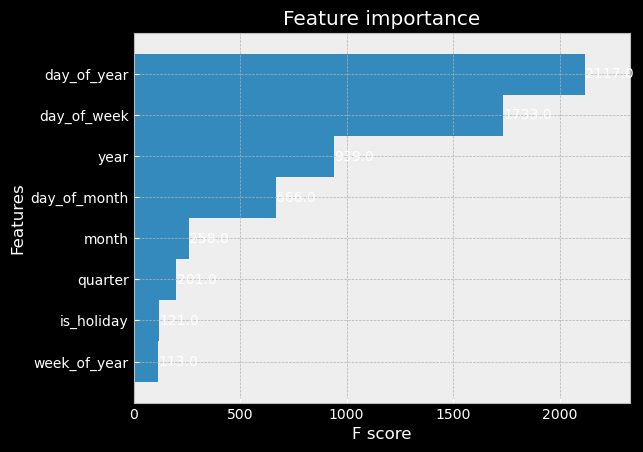

In [157]:
plot_importance(regressor_xgb, height=1)

Добавление информации о выходных не позволило уменьшить ошибку прогнозирования. Попробуем добавить лаговые факторы.

## data addition: lags
Task 10 

Добавьте лаги. Обратите внимание на размер тестовой выборки: она будет влиять на допустимое значение для лагов.

In [162]:
def get_features_holidays_lags(data, lag_start=5, lag_end=20, test_size=0.15):
    '''Function constructs: lag features in range from lag_start to lag_end, 
    descriptional features based on date, holiday flag, 
    and divides a copy of data due to test_size given in params'''
    
    data = data.copy()

    # finding out a limiting index btw test and train parts and the corresponding date
    split_index = int(len(data)*(1-test_size))
    split_date = data.date.iloc[split_index]

    # lags
    for i in range(lag_start, lag_end):
        data['lag_{}'.format(i)] = data.unit_sales.shift(i)
    
    # date_based new features
    data['dayofweek'] = data.date.dt.dayofweek
    data['quarter'] = data.date.dt.quarter
    data['month'] = data.date.dt.month
    data['year'] = data.date.dt.year
    data['dayofyear'] = data.date.dt.dayofyear
    data['dayofmonth'] = data.date.dt.day
    data['weekofyear'] = data.date.dt.weekofyear

    data['is_holiday'] = data.date.apply(get_holiday_flag)
    

    # train test split
    X_train = data.loc[data.date <= split_date].drop(['unit_sales', 'date'], axis=1) 
    y_train = data.loc[data.date <= split_date]['unit_sales']
    
    X_test = data.loc[data.date > split_date].drop(['unit_sales', 'date'], axis=1)
    y_test = data.loc[data.date > split_date]['unit_sales']
    
    data.drop('date', axis=1, inplace=True)

    return X_train, X_test, y_train, y_test, split_day


In [163]:
X_train, X_test, y_train, y_test, split_day = get_features_holidays_lags(sales_df, test_size=0.15, lag_start=31, lag_end=45)

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\996424546.py:23: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



In [164]:
X_test.shape

(252, 22)

## Fitting
11 Пересчитайте модели, сравните метрики. Сделайте вывод.

In [165]:
regressor_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

C:\Users\ElenaS\anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

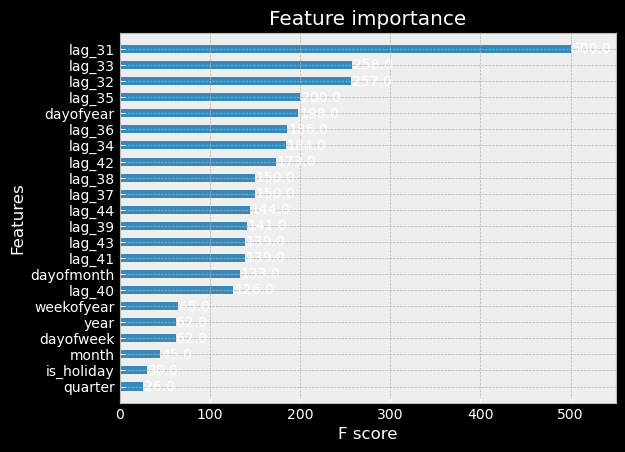

In [166]:
_ = plot_importance(regressor_xgb, height=0.5)

In [167]:
regressor_cbr.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

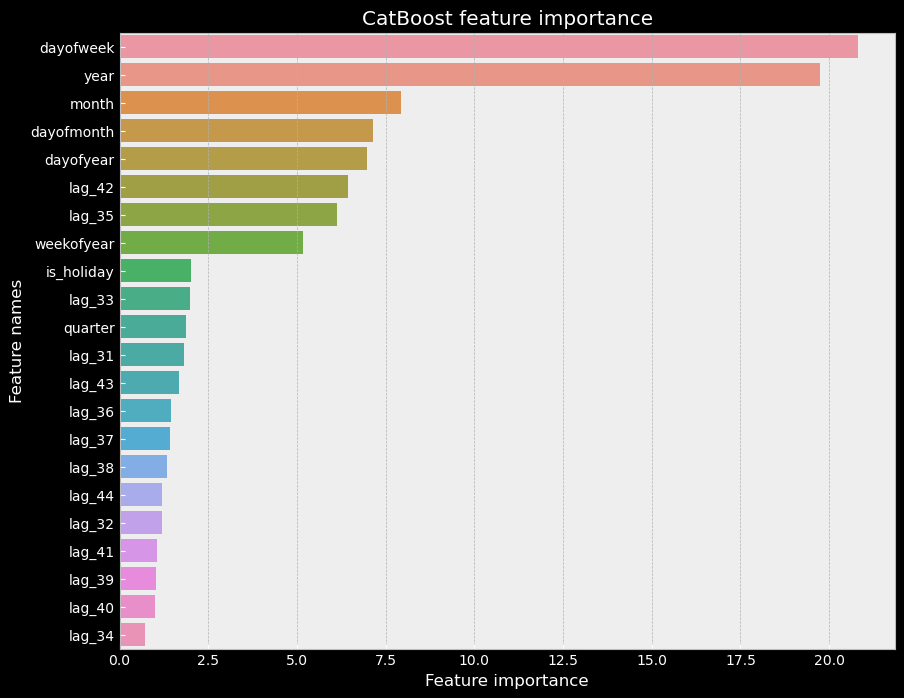

In [168]:
#plot the catboost result
plot_feature_importance(regressor_cbr.get_feature_importance(),X_train.columns,'CatBoost')

### Predictions

In [169]:
xgb_prediction_fhl = regressor_xgb.predict(X_test)

In [170]:
ctb_prediction_fhl = regressor_cbr.predict(X_test)

### Plots

In [171]:
split_day

'2016-01-01'

In [172]:
py.iplot([
    go.Scatter(x=sales_df[sales_df.date > split_day].date, y=y_test.values, name='Sales'), 
    go.Scatter(x=sales_df[sales_df.date > split_day].date, y=xgb_prediction_fhl, name='XGb forecast'), 
    go.Scatter(x=sales_df[sales_df.date > split_day].date, y=ctb_prediction_fhl, name='Cbr forecast')
])

### Metrics

In [173]:
# f- features,  h-holidays, l- lags
xgb_mse_fhl = mean_squared_error(y_true=y_test, y_pred=xgb_prediction_fhl)
xgb_mape_fhl = mean_absolute_percentage_error(y_true=y_test, y_pred=xgb_prediction_fhl)
xgb_mae_fhl = mean_absolute_error(y_true=y_test, y_pred=xgb_prediction_fhl)


print(f'''xgb_mse_fhl: {xgb_mse_fhl}
xgb_mape_fhl: {xgb_mape_fhl}
xgb_mae_fhl: {xgb_mae_fhl}''')

xgb_mse_fhl: 18907435284.93649
xgb_mape_fhl: 0.4209888280094644
xgb_mae_fhl: 101003.18097420635


In [174]:
ctb_mse_fhl = mean_squared_error(y_true=y_test, y_pred=ctb_prediction_fhl)
ctb_mae_fhl = mean_absolute_error(y_true=y_test, y_pred=ctb_prediction_fhl)
ctb_mape_fhl = mean_absolute_percentage_error(y_true=y_test, y_pred=ctb_prediction_fhl)

print(f'''ctb_mse_fhl: {ctb_mse_fhl}
ctb_mape_fhl: {ctb_mape_fhl}
ctb_mae_fhl: {ctb_mae_fhl}''')

ctb_mse_fhl: 18983498315.415176
ctb_mape_fhl: 0.4309717511787253
ctb_mae_fhl: 101859.17321397043


## Conclusions

Бустинговые модели дают ощутимый рост в качестве прогнозирования при добавлении лаговых факторов,
создание признаков на основе дат тоже существенно. 

Добавление данных о праздничных днях не дает заметного толчка в росте качества прогноза, предположу, потому что эта информация уже представлена в совокупности признаков  day_of_year, day_of_week и year.  

Шутки ради, проверим это. В данные для обучения регрессоров не станем добавлять признак принадлежности даты к выходным дням.

### some more 

Из предобработки входных данных я уберу признак выходного дня, оставив только признаки на основе даты и  лаги.

In [175]:
def get_features_lags(data, lag_start=5, lag_end=20, test_size=0.15):
    '''Function constructs: lag features in range from lag_start to lag_end, 
    descriptional features based on date, holiday flag, 
    and divides a copy of data due to test_size given in params'''
    
    data = data.copy()

    # finding out a limiting index btw test and train parts and the corresponding date
    split_index = int(len(data)*(1-test_size))
    split_date = data.date.iloc[split_index]

    # lags
    for i in range(lag_start, lag_end):
        data['lag_{}'.format(i)] = data.unit_sales.shift(i)
    
    # date_based new features
    data['dayofweek'] = data.date.dt.dayofweek
    data['quarter'] = data.date.dt.quarter
    data['month'] = data.date.dt.month
    data['year'] = data.date.dt.year
    data['dayofyear'] = data.date.dt.dayofyear
    data['dayofmonth'] = data.date.dt.day
    data['weekofyear'] = data.date.dt.weekofyear

    #data['is_holiday'] = data.date.apply(get_holiday_flag)
    

    # train test split
    X_train = data.loc[data.date <= split_date].drop(['unit_sales', 'date'], axis=1) 
    y_train = data.loc[data.date <= split_date]['unit_sales']
    
    X_test = data.loc[data.date > split_date].drop(['unit_sales', 'date'], axis=1)
    y_test = data.loc[data.date > split_date]['unit_sales']
    
    data.drop('date', axis=1, inplace=True)

    return X_train, X_test, y_train, y_test, split_day


In [176]:
X_train, X_test, y_train, y_test, split_day = get_features_lags(sales_df, test_size=0.15, lag_start=31, lag_end=45)

C:\Users\ElenaS\AppData\Local\Temp\ipykernel_9136\4011737786.py:23: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



#### Xgboost

In [177]:
regressor_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

C:\Users\ElenaS\anaconda3\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

In [178]:
xgb_prediction_fl = regressor_xgb.predict(X_test)

In [179]:
xgb_mse_fl = mean_squared_error(y_true=y_test, y_pred=xgb_prediction_fl)
xgb_mape_fl = mean_absolute_percentage_error(y_true=y_test, y_pred=xgb_prediction_fl)
xgb_mae_fl = mean_absolute_error(y_true=y_test, y_pred=xgb_prediction_fl)


print(f'''xgb_mse_fl: {xgb_mse_fl}
xgb_mape_fl: {xgb_mape_fl}
xgb_mae_fl: {xgb_mae_fl}''')

xgb_mse_fl: 18337080250.922836
xgb_mape_fl: 0.4123307826441744
xgb_mae_fl: 97743.46182936507


xgb_mse_fhl: 18907435284.93649

xgb_mape_fhl: 0.4209888280094644

xgb_mae_fhl: 101003.18097420635

Две метрики из трех показывают улучшение качества предсказания. 

#### Catboost

In [180]:
regressor_cbr.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

In [181]:
ctb_prediction_fl = regressor_cbr.predict(X_test)

In [182]:
ctb_mse_fl = mean_squared_error(y_true=y_test, y_pred=ctb_prediction_fl)
ctb_mae_fl = mean_absolute_error(y_true=y_test, y_pred=ctb_prediction_fl)
ctb_mape_fl = mean_absolute_percentage_error(y_true=y_test, y_pred=ctb_prediction_fl)

print(f'''ctb_mse_fl: {ctb_mse_fhl}
ctb_mape_fl: {ctb_mape_fhl}
ctb_mae_fl: {ctb_mae_fhl}''')

ctb_mse_fl: 18983498315.415176
ctb_mape_fl: 0.4309717511787253
ctb_mae_fl: 101859.17321397043


ctb_mse_fhl: 18983498315.415176

ctb_mape_fhl: 0.4309717511787253

ctb_mae_fhl: 101859.17321397043


Catboost не показал изменения качества прогноза без отсутствия признака выходного дня. 

#### Grow dirs

Для улучшения качества прогноза нужно поэкспериментировать с обогащением данных. 

